# Wavelet Approximation

In this chapter, we discuss how wavelet-based compression affects the similarity data obtained by DTW.

## Prepartion

In [1]:
include("../julia/lib.jl")
include("../julia/img.jl")
include("../julia/pruning_test.jl")
using Gadfly
using DataFrames
using Compose

set_default_plot_size(25cm, 15cm)

map_i2s, map_s2i = loadmap("../data/final.map")
n = length(map_i2s)
m = 256

data_logsmooth_ref     = loaddata("../data/v0-forwavelet_smooth1.data", m, n, Float64)
data_logsmooth_approx1 = loaddata("../data/v0-forwavelet_smooth1_approx.data", m, n, Float64)
data_logsmooth_approx2 = loaddata("../data/v0-forwavelet_smooth1_approx_smooth1.data", m, n, Float64)
data_logsmooth_approx3 = loaddata("../data/v0-forwavelet_approx_smooth1.data", m, n, Float64)
data_gradient_ref      = loaddata("../data/v0-dtw_smooth1.data", m, n, Float64)
data_gradient_approx1  = loaddata("../data/v0-dtw_smooth1_approx.data", m, n, Float64)
data_gradient_approx2  = loaddata("../data/v0-dtw_smooth1_approx_smooth1.data", m, n, Float64)
data_gradient_approx3  = loaddata("../data/v0-dtw_smooth1_approx2.data", m, n, Float64)

year_first = 1753
t = collect(year_first:(year_first + m - 1))
print()

In [2]:
function plot_neighbors(d, l, title, norm=norm_id, trans=transform_id)
    plot_all_that(d, map_s2i, t, l , norm, trans, title, Geom.line, Theme(line_width=0.1mm))
end

function plot_deltas(d1, d2, l, title)
    fnorm = norm_id
    ftransform = transform_id
    dfs = map(ng -> DataFrame(x=t, y=(get_from_data(d1, map_s2i[ng], fnorm, ftransform) - get_from_data(d2, map_s2i[ng], fnorm, ftransform)), label=ng), l)
    df = reduce(vcat, DataFrame(), dfs)
    geo = Geom.line
    th = Theme(line_width=0.1mm)
    plot_dataframe(df, title, geo, th)
end


print()

## Data Choice and Explanations

First, we need a data pipeline to evaluate our the impact of the compression. These are the building blocks which can form the pipeline:

- `input`: cleaned input data from Google
- `log`: $\log(x + 1)$
- `smooth1`: Gauss smoothing with $\sigma=1$
- `smooth2`: Gauss smoothing with $\sigma=2$
- `wavelet`: Wavelet compression and decompression with $\mathrm{error}=5$
- `gradient`: Gradient calculation

The ngrams used to compare the distances are the top 20 neighbors of the ngram `drug`, calculated by the reference (i.e. uncompressed) algorithm:

In [3]:
l1 = ["drug", "treatment", "impair", "fundament", "scar", "tract", "conjunct", "univers", "demonstr", "western", "li", "mayb", "sex", "promot", "member", "blood", "action", "malign", "counter", "formal"]

20-element Array{ASCIIString,1}:
 "drug"     
 "treatment"
 "impair"   
 "fundament"
 "scar"     
 "tract"    
 "conjunct" 
 "univers"  
 "demonstr" 
 "western"  
 "li"       
 "mayb"     
 "sex"      
 "promot"   
 "member"   
 "blood"    
 "action"   
 "malign"   
 "counter"  
 "formal"   

## Different Compression Approaches

First we compare the data which is emited by the different approaches.

### Reference

We start with the reference plots without the gradient calculation:

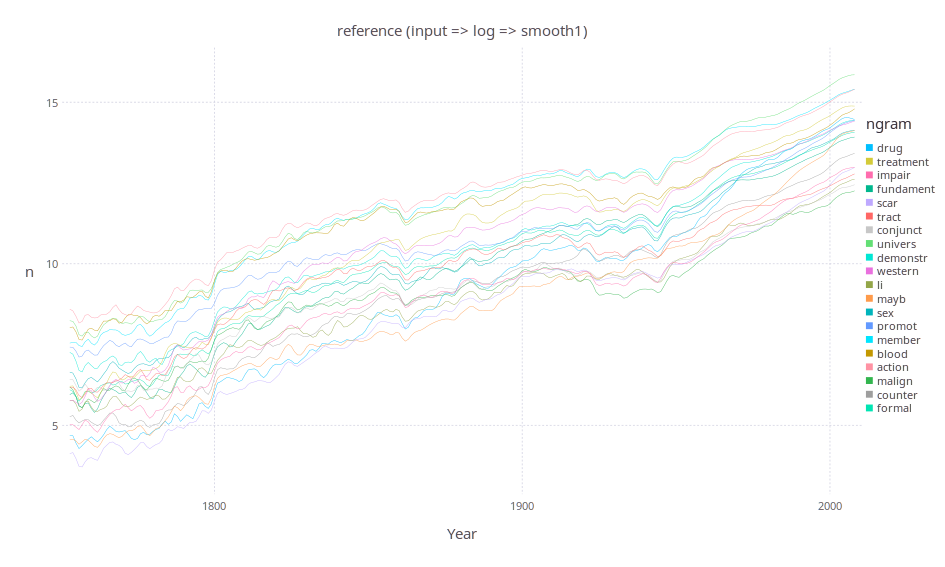

In [4]:
plot_neighbors(data_logsmooth_ref, l1, "reference (input => log => smooth1)")

The data looks smooth, ideal for the upcoming gradient calculation. The frequency spectrum confirms that visual impression:

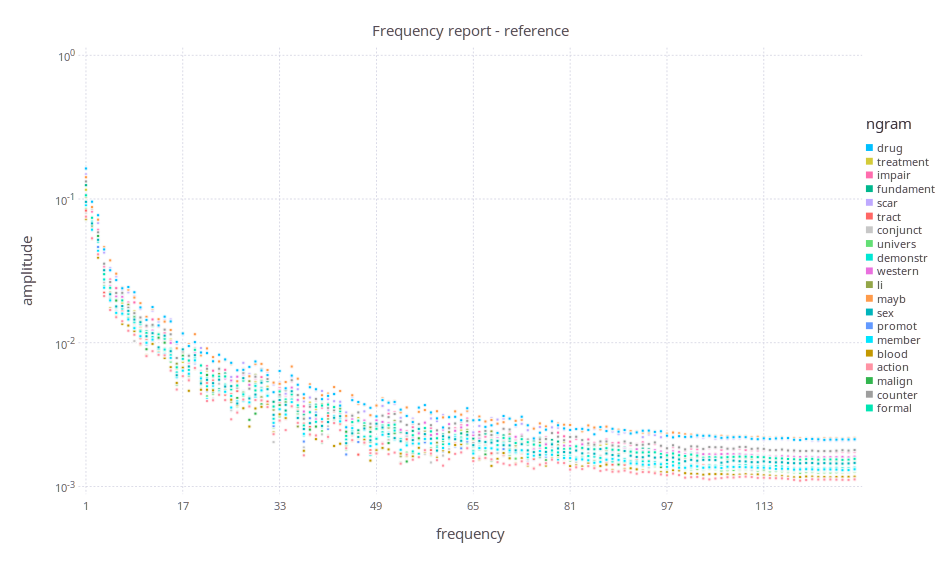

In [5]:
print_frequency_report(data_logsmooth_ref, map_s2i, m, l1, transform_id, "reference")

The gradient is also smooth:

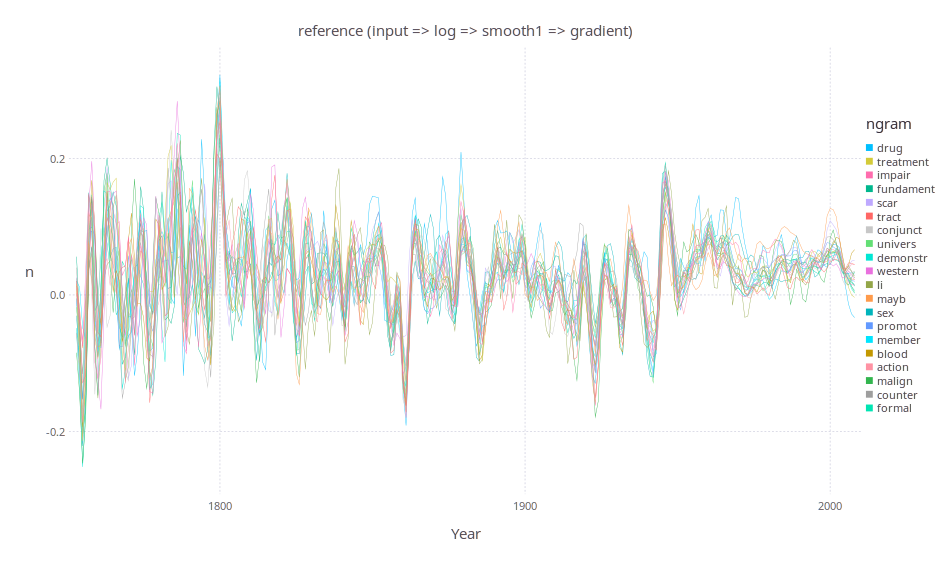

In [6]:
plot_neighbors(data_gradient_ref, l1, "reference (input => log => smooth1 => gradient)")

As in the last case, this can also be confirmed with a frequency plot:

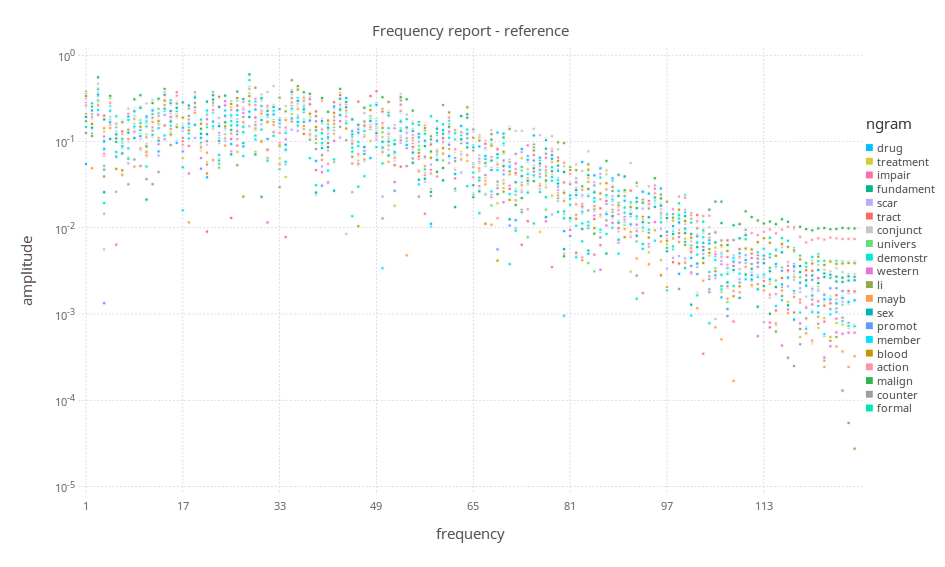

In [7]:
print_frequency_report(data_gradient_ref, map_s2i, m, l1, transform_id, "reference")

### Approx 1

Now we compare it with `approx1`, naive approach of wavelet compression. The compression is applied before the gradient calculation but after the smoothing. The reason we apply all compression methods before the gradient calculation is the future usage of the wavelet-tree structure as an index structure for the DTW algorithm. Because of the buttom-up merges of the wavelet-trees, the gradient-like information are merged first and therefore do not need to be precalculated as an input. As you can see, the result of the compression is quite unsmooth.

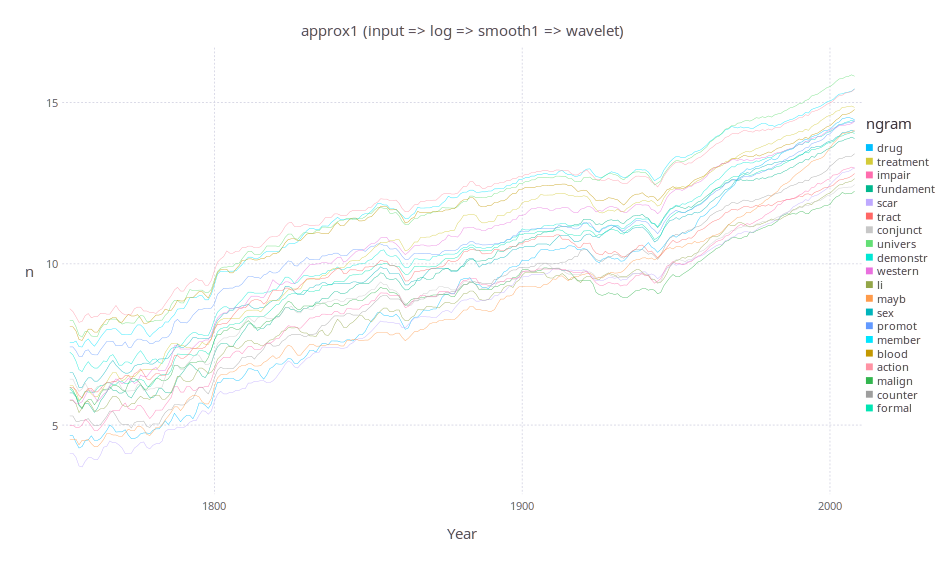

In [8]:
plot_neighbors(data_logsmooth_approx1, l1, "approx1 (input => log => smooth1 => wavelet)")

The frequency plot confirms that the wavelet compression introduces higher frequencies:

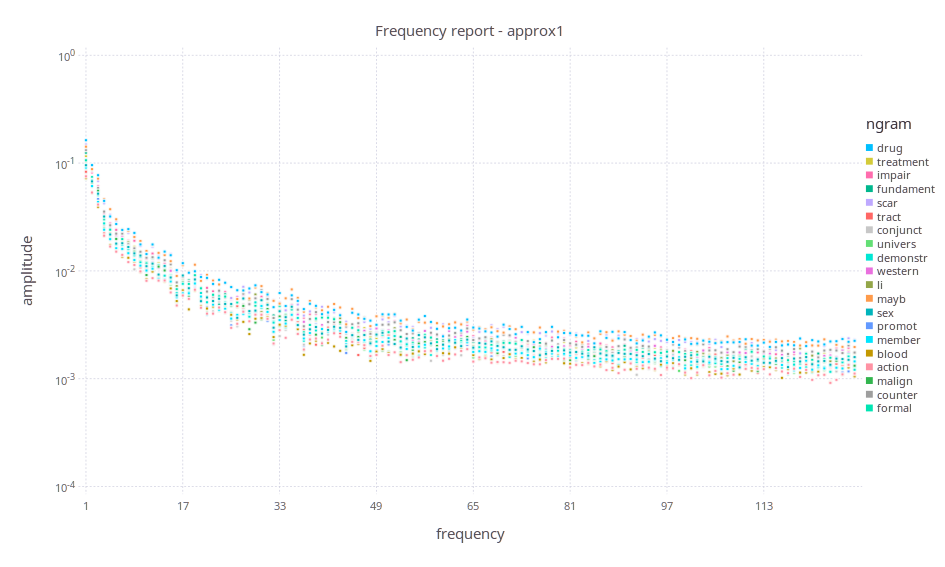

In [9]:
print_frequency_report(data_logsmooth_approx1, map_s2i, m, l1, transform_id, "approx1")

On the other hand, the approach does not result in too high error values in the pure data:

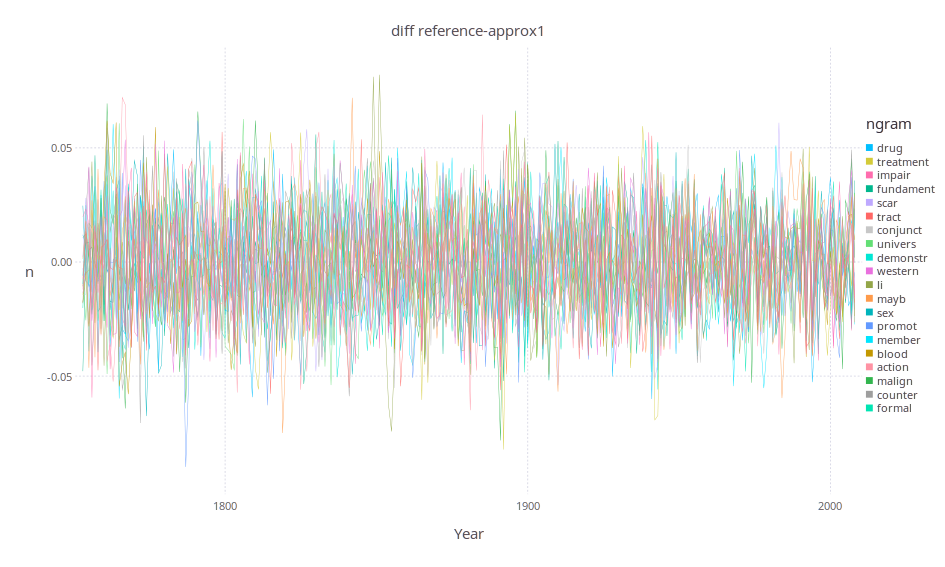

In [10]:
plot_deltas(data_logsmooth_ref, data_logsmooth_approx1, l1, "diff reference-approx1")

As assumed the gradient of the `approx1` approach is spiky:

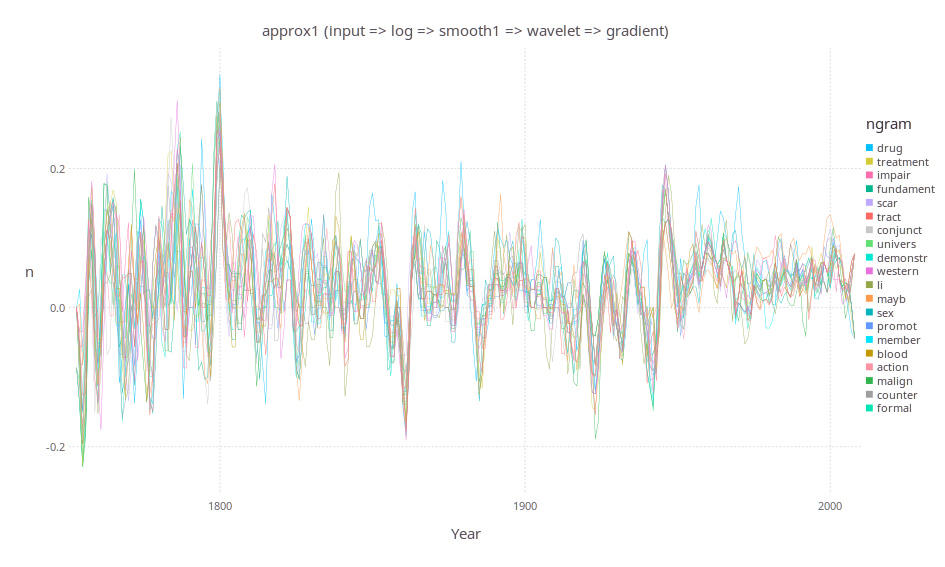

In [11]:
plot_neighbors(data_gradient_approx1, l1, "approx1 (input => log => smooth1 => wavelet => gradient)")

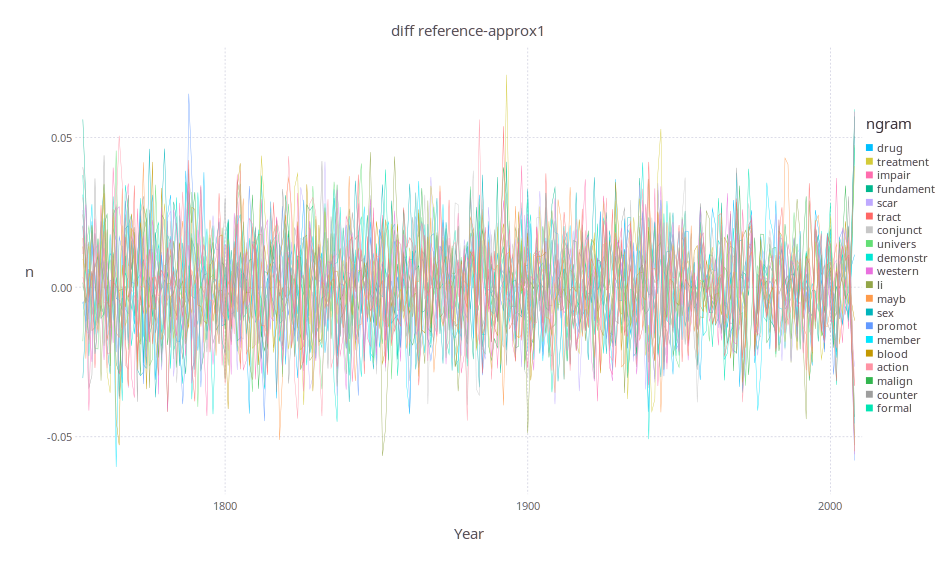

In [12]:
plot_deltas(data_gradient_ref, data_gradient_approx1, l1, "diff reference-approx1")

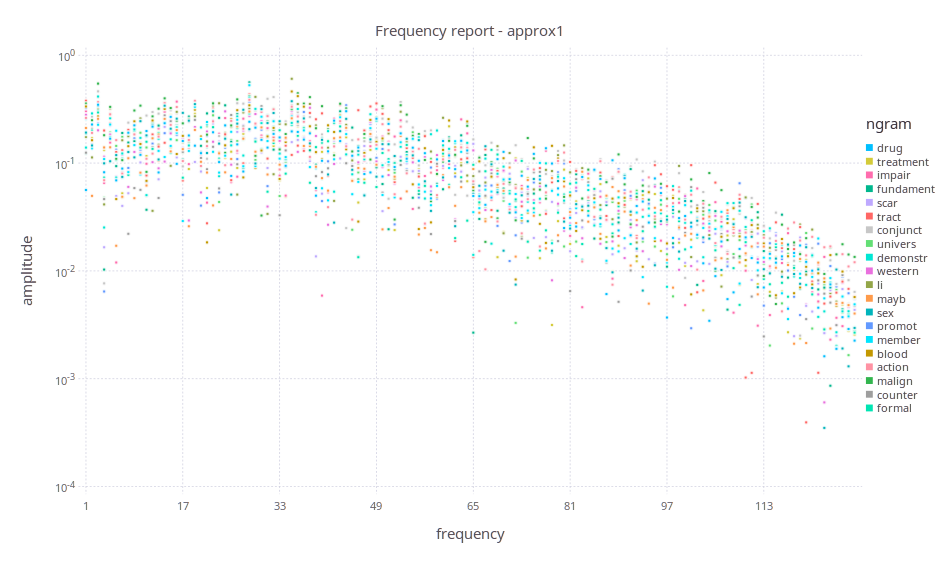

In [13]:
print_frequency_report(data_gradient_approx1, map_s2i, m, l1, transform_id, "approx1")

### Approx 2

After recognizing that the high frequencies introduces by `approx1` will lead to problems, we decided to filter out these frequencies after the decompression:

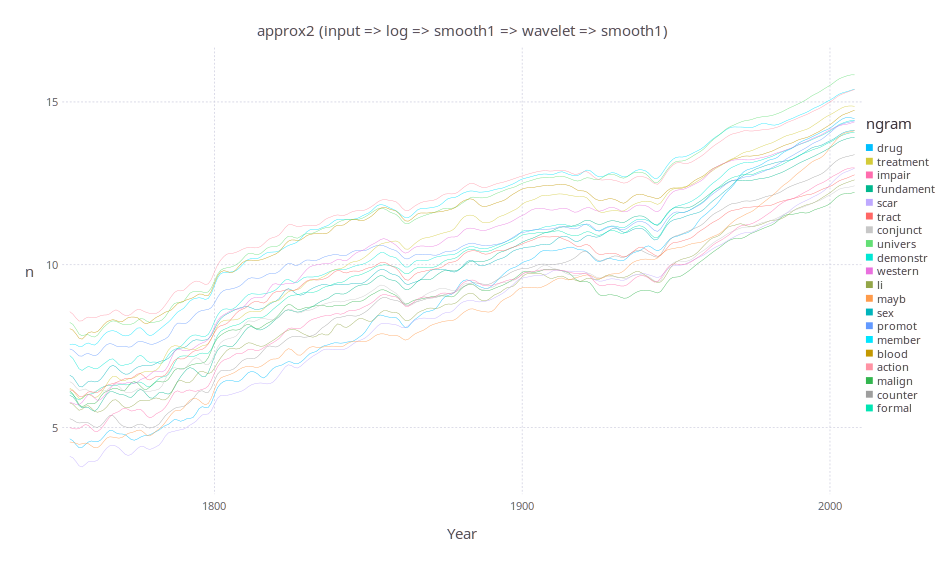

In [14]:
plot_neighbors(data_logsmooth_approx2, l1, "approx2 (input => log => smooth1 => wavelet => smooth1)")

While the data is more smooth now, the additional filter removes to much information:

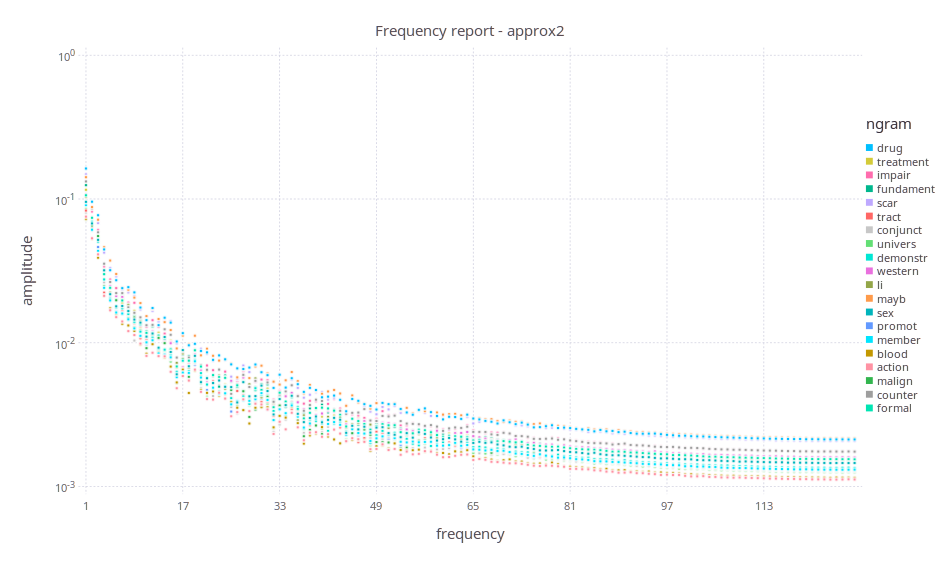

In [15]:
print_frequency_report(data_logsmooth_approx2, map_s2i, m, l1, transform_id, "approx2")

This also results in higher differencs compared to the reference:

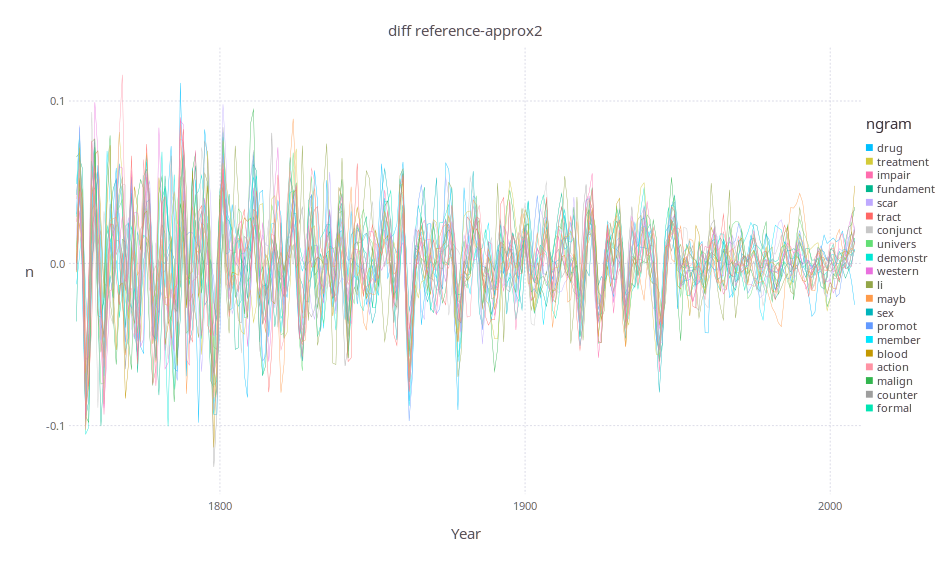

In [16]:
plot_deltas(data_logsmooth_ref, data_logsmooth_approx2, l1, "diff reference-approx2")

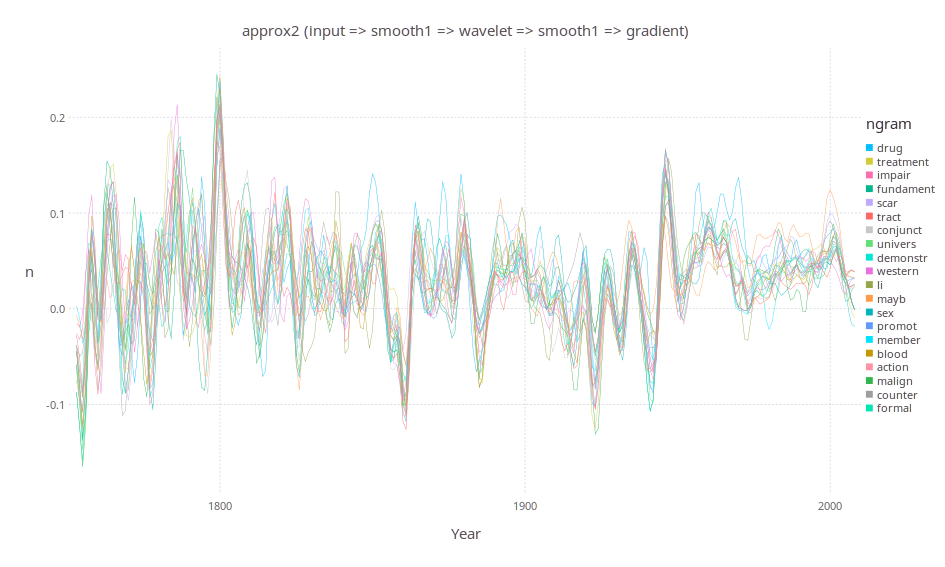

In [17]:
plot_neighbors(data_gradient_approx2, l1, "approx2 (input => smooth1 => wavelet => smooth1 => gradient)")

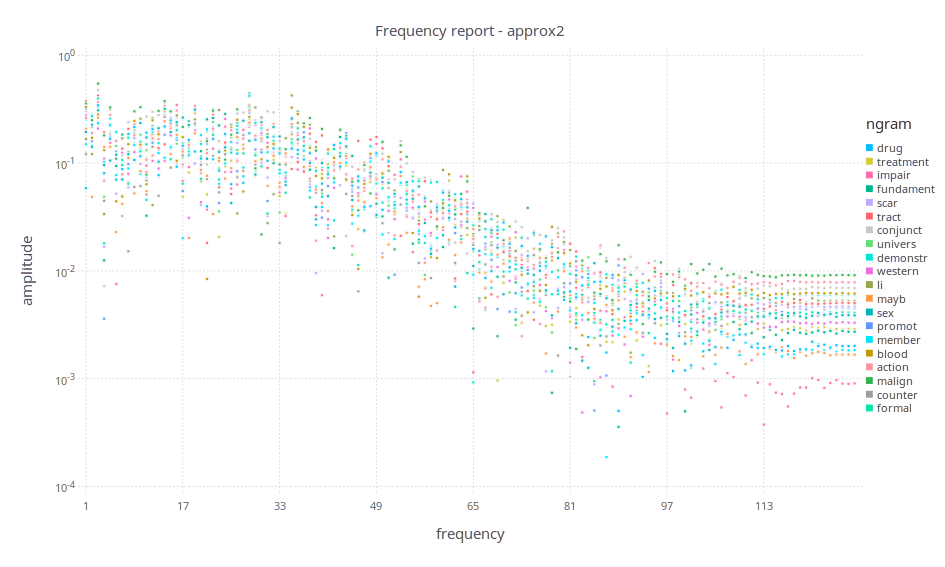

In [18]:
print_frequency_report(data_gradient_approx2, map_s2i, m, l1, transform_id, "approx2")

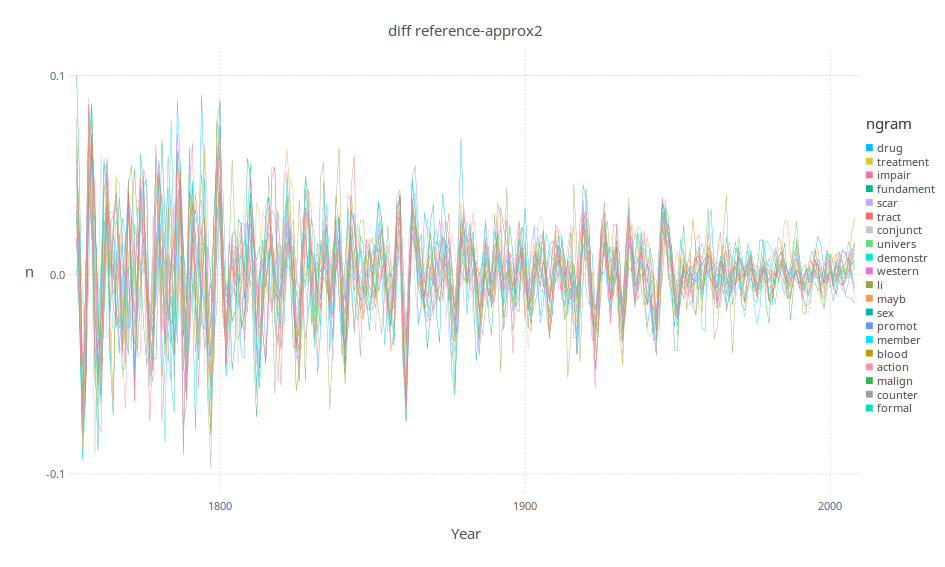

In [19]:
plot_deltas(data_gradient_ref, data_gradient_approx2, l1, "diff reference-approx2")

### Approx 3

The filter values of `approx2` might be controlled to archive similar results as `reference`, but this would require to control 2 parameters of which one also affects the compression rate. An easier approach is to remove the smoothing before the compression and only smooth before the DTW calculation:

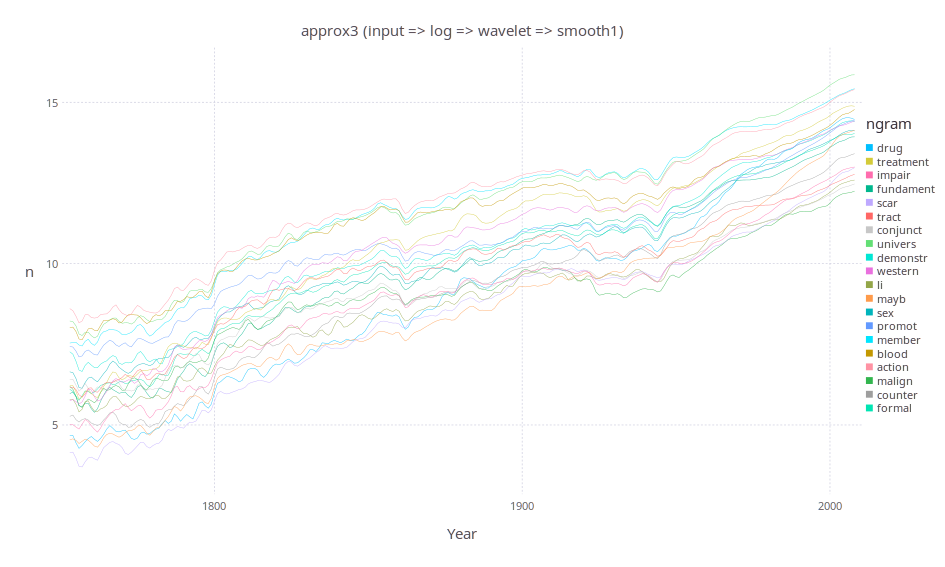

In [20]:
plot_neighbors(data_logsmooth_approx3, l1, "approx3 (input => log => wavelet => smooth1)")

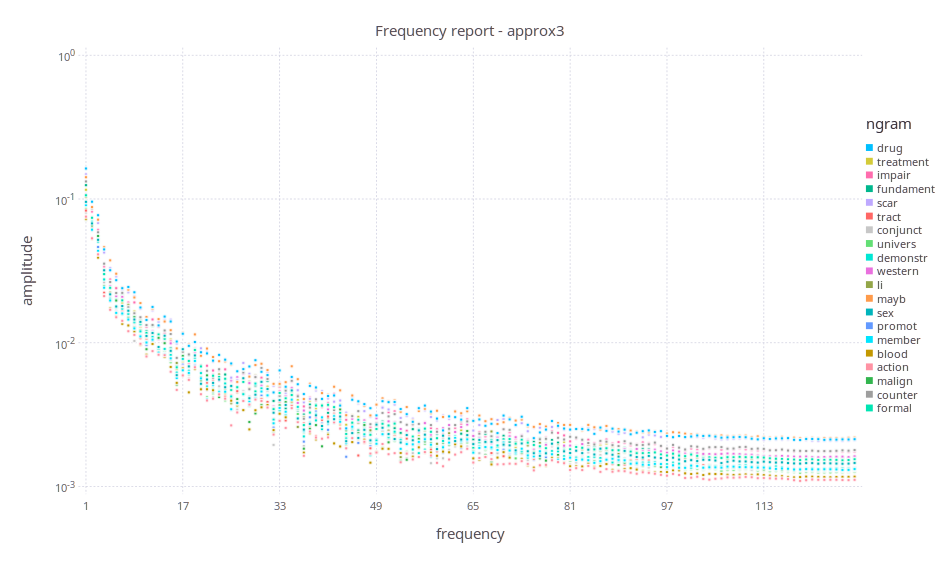

In [21]:
print_frequency_report(data_logsmooth_approx3, map_s2i, m, l1, transform_id, "approx3")

This also results in very low differences, even lower than `approx1`:

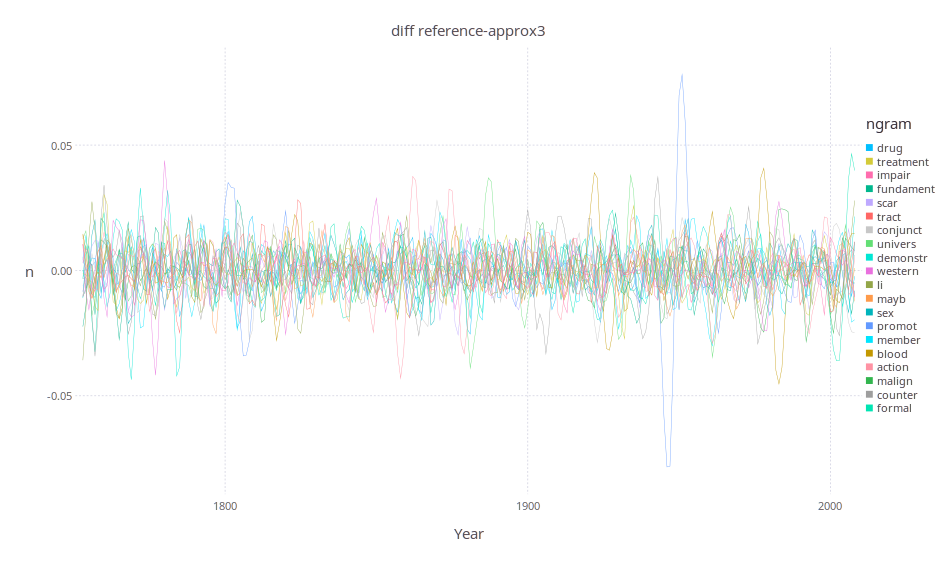

In [22]:
plot_deltas(data_logsmooth_ref, data_logsmooth_approx3, l1, "diff reference-approx3")

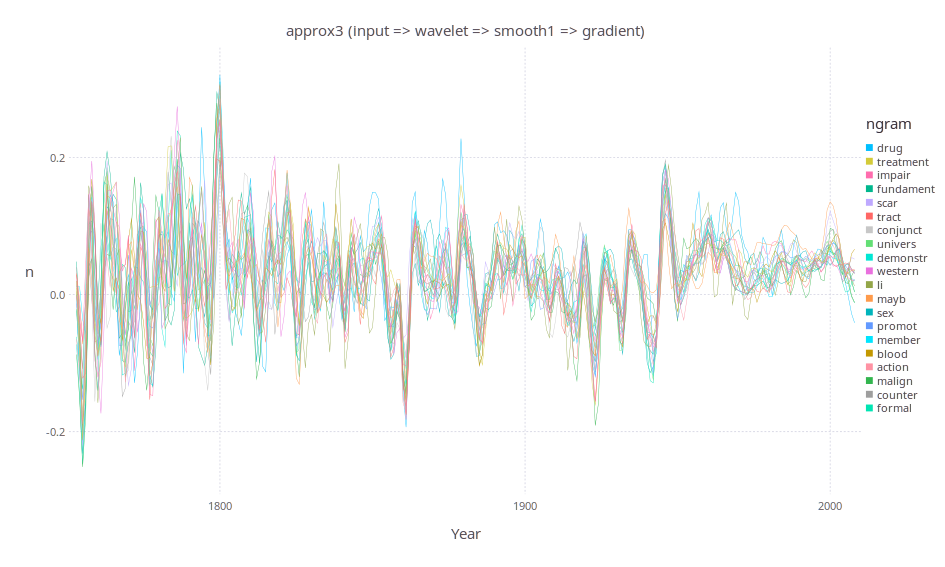

In [23]:
plot_neighbors(data_gradient_approx3, l1, "approx3 (input => wavelet => smooth1 => gradient)")

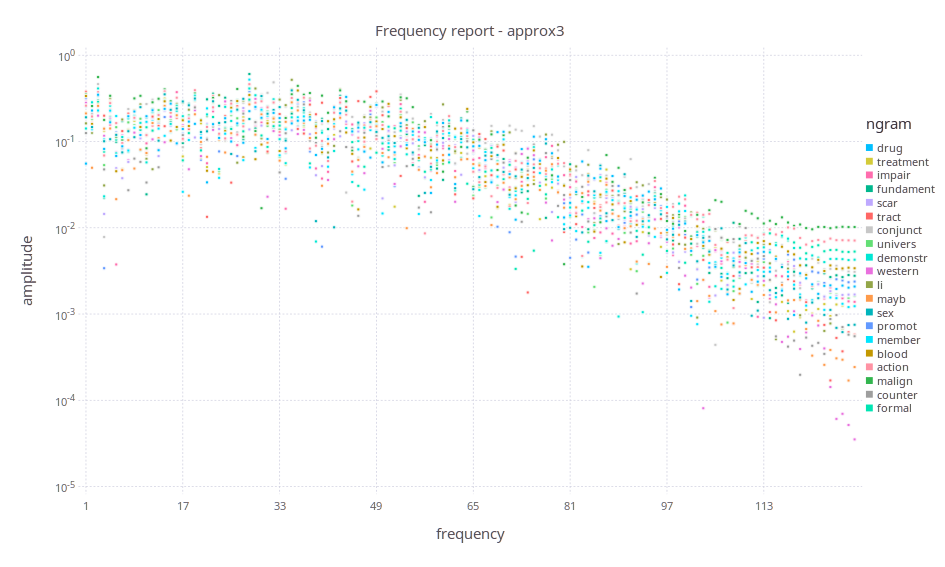

In [24]:
print_frequency_report(data_gradient_approx3, map_s2i, m, l1, transform_id, "approx3")

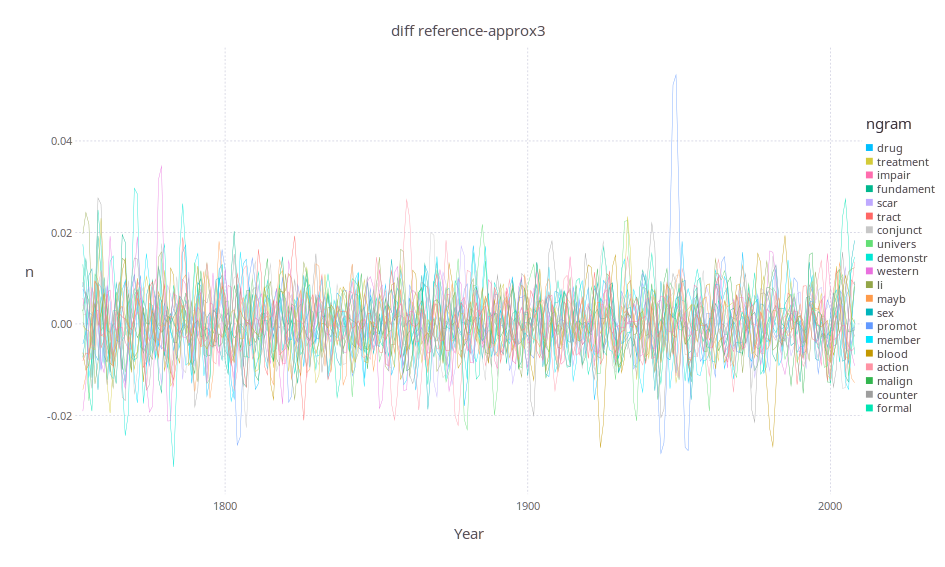

In [25]:
plot_deltas(data_gradient_ref, data_gradient_approx3, l1, "diff reference-approx3")

## DTW Results

We now want to see how the compression actually affects the DTW results.

### Top 20 Queries

The first try is to gather the top 20 neighbors of the word `drug` with a warp-radius of $10$:

**reference:**

|      ngram |         id |   distance |
|------------|------------|------------|
|       drug |     193656 |          0 |
|  treatment |     724553 |   0.535434 |
|     impair |     327512 |   0.546071 |
|  fundament |     254024 |   0.553962 |
|       scar |     626048 |    0.55751 |
|      tract |     722078 |   0.562262 |
|   conjunct |     142419 |   0.563252 |
|    univers |     742229 |   0.563944 |
|   demonstr |     171459 |   0.565056 |
|    western |     775581 |   0.565099 |
|         li |     400881 |   0.566289 |
|       mayb |     435496 |    0.56714 |
|        sex |     641699 |   0.567364 |
|     promot |     569769 |   0.567417 |
|     member |     442449 |   0.567583 |
|      blood |      81147 |   0.569289 |
|     action |       5811 |    0.57146 |
|     malign |     424473 |   0.572009 |
|    counter |     149795 |   0.572549 |
|     formal |     246240 |   0.574327 |

**approx1:**

|      ngram |         id |   distance |
|------------|------------|------------|
|       drug |     193656 |          0 |
|  treatment |     724553 |   0.573106 |
|      blood |      81147 |   0.594426 |
| experiment |     226464 |   0.595649 |
|  represent |     596917 |   0.600238 |
|    privaci |     567348 |    0.60195 |
|        sex |     641699 |   0.603098 |
|       educ |     202130 |    0.60395 |
|  contribut |     145091 |   0.605981 |
|    univers |     742229 |   0.606201 |
|       mayb |     435496 |   0.610676 |
|      tract |     722078 |   0.611152 |
|     impair |     327512 |   0.611182 |
|       pain |     522132 |   0.611585 |
| understand |     740340 |   0.611676 |
|    decreas |     167656 |   0.612177 |
|      peopl |     535975 |   0.613802 |
|     formal |     246240 |   0.614294 |
|     health |     297411 |   0.614652 |
|          r |     582127 |   0.615218 |

**approx2:**

|      ngram |         id |   distance |
|------------|------------|------------|
|       drug |     193656 |          0 |
|      polit |     554250 |   0.366598 |
|     exampl |     224936 |   0.371035 |
|     critic |     153678 |   0.371369 |
|      blood |      81147 |   0.374273 |
|       pose |     558010 |   0.377084 |
|     disord |     184474 |   0.377981 |
|     intern |     335938 |     0.3796 |
|    complic |     139733 |   0.380334 |
|       trap |     723861 |   0.380408 |
|  treatment |     724553 |   0.380629 |
|    privaci |     567348 |    0.38363 |
|   demonstr |     171459 |   0.384296 |
|       soar |     659835 |   0.384376 |
|  physician |     544841 |    0.38461 |
|     involv |     338191 |   0.384727 |
|    element |     207133 |   0.384811 |
|       educ |     202130 |   0.385169 |
|     expand |     226274 |   0.385468 |

**approx3:**

|      ngram |         id |   distance |
|------------|------------|------------|
|       drug |     193656 |          0 |
|  treatment |     724553 |    0.55757 |
|  fundament |     254024 |   0.565181 |
|      tract |     722078 |   0.578912 |
| supplement |     687144 |   0.580091 |
|     impair |     327512 |   0.580302 |
|    degener |     168853 |   0.580632 |
|      blood |      81147 |   0.580909 |
|   conjunct |     142419 |   0.583339 |
|   demonstr |     171459 |   0.585516 |
|     privat |     567360 |   0.585573 |
|       mayb |     435496 |   0.585578 |
|    univers |     742229 |    0.58687 |
|        due |     195072 |   0.587408 |
|         li |     400881 |   0.587924 |
| experiment |     226464 |    0.59076 |
|    complic |     139733 |   0.591357 |
|    resolut |     597950 |   0.591798 |
|     member |     442449 |   0.592161 |
|        sex |     641699 |   0.592737 |

While there are common entries within the lists, it also turns out that even small jitter affects in the input can results in changes of the top 20 list. The reason for that are the small differences within the distances of the candidates. Let's have a look at the distribution of the distance values:

In [26]:
fp_dists = open("../data/ref-dists.datax")
dists = sort(Mmap.mmap(fp_dists, Matrix{Float64}, (n, 1))[:,1])
norm_factor = 1.0 / dists[2]
dists_norm = dists .* norm_factor

803042-element Array{Float64,1}:
  0.0    
  1.0    
  1.01987
  1.0346 
  1.04123
  1.05011
  1.05195
  1.05325
  1.05532
  1.0554 
  1.05763
  1.05922
  1.05963
  ⋮      
 14.1312 
 14.3421 
 14.3499 
 14.3544 
 14.4358 
 14.8955 
 15.0974 
 15.1486 
 15.3031 
 16.3037 
 16.6809 
 17.5741 

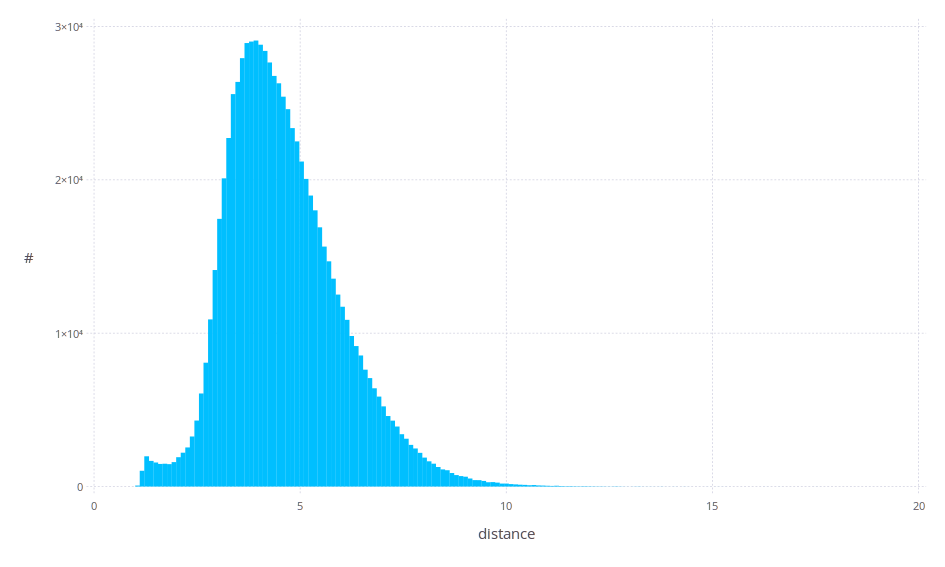

In [27]:
Gadfly.plot(x=dists_norm[2:end], Geom.histogram, Guide.ylabel("#"), Guide.xlabel("distance"))

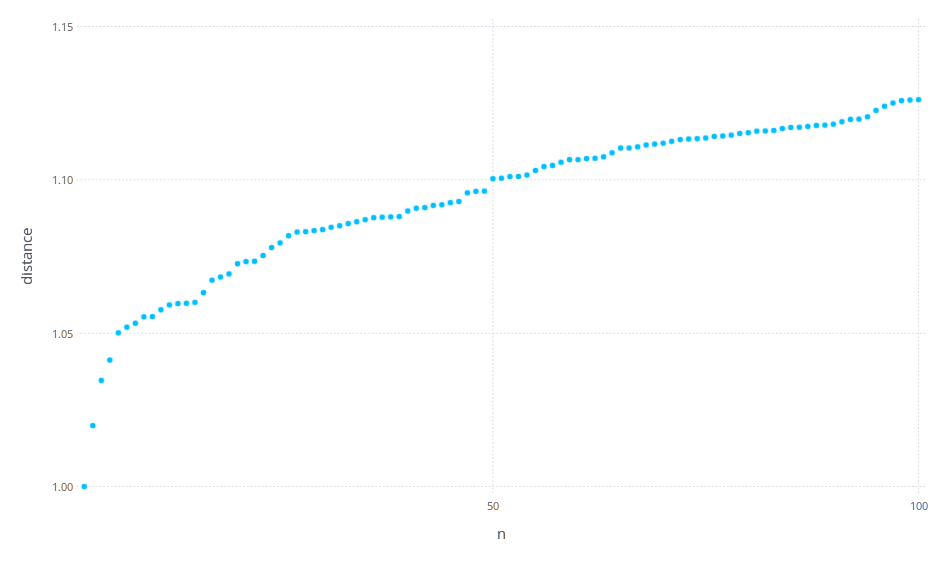

In [28]:
Gadfly.plot(x=collect(2:100), y=dists_norm[2:100], Geom.point, Guide.ylabel("distance"), Guide.xlabel("n"), Coord.Cartesian(xmin=2, xmax=100))

Now it seems that there is a high difference between the first, the second and the third neighbor, but actually the differnce in distance is less than 5%, for the top 50 less than 10%. Its unclear if that tiny difference justify the ranking.

## Comparison

To get a better idea of the effect on the distances, we now simply use the top 20 neighbors of the reference approach and compare the changes of the distances:

In [29]:
df = vcat(
DataFrame(ngram="drug", ref=0.0, approx1=0.0, approx2=0.0, approx3=0.0),
DataFrame(ngram="treatment", ref=0.535434, approx1=0.573106, approx2=0.380629, approx3=0.55757),
DataFrame(ngram="impair", ref=0.546071, approx1=0.611182, approx2=0.390362, approx3=0.580302),
DataFrame(ngram="fundament", ref=0.553962, approx1=0.616639, approx2=0.41429, approx3=0.565181),
DataFrame(ngram="scar", ref=0.55751, approx1=0.621865, approx2=0.3947, approx3=0.595435),
DataFrame(ngram="tract", ref=0.562262, approx1=0.611152, approx2=0.405339, approx3=0.578912),
DataFrame(ngram="conjunct", ref=0.563252, approx1=0.619515, approx2=0.439238, approx3=0.583339),
DataFrame(ngram="univers", ref=0.563944, approx1=0.606201, approx2=0.408217, approx3=0.58687),
DataFrame(ngram="demonstr", ref=0.565056, approx1=0.630969, approx2=0.384296, approx3=0.585516),
DataFrame(ngram="western", ref=0.565099, approx1=0.637848, approx2=0.407995, approx3=0.600948),
DataFrame(ngram="li", ref=0.566289, approx1=0.627923, approx2=0.420896, approx3=0.587924),
DataFrame(ngram="mayb", ref=0.56714, approx1=0.610676, approx2=0.425557, approx3=0.585578),
DataFrame(ngram="sex", ref=0.567364, approx1=0.603098, approx2=0.389745, approx3=0.592737),
DataFrame(ngram="promot", ref=0.567417, approx1=0.622654, approx2=0.424851, approx3=0.609919),
DataFrame(ngram="member", ref=0.567583, approx1=0.63364, approx2=0.430955, approx3=0.592161),
DataFrame(ngram="blood", ref=0.569289, approx1=0.594426, approx2=0.374273, approx3=0.580909),
DataFrame(ngram="action", ref=0.57146, approx1=0.656863, approx2=0.427567, approx3=0.608005),
DataFrame(ngram="malign", ref=0.572009, approx1=0.644498, approx2=0.394919, approx3=0.60649),
DataFrame(ngram="counter", ref=0.572549, approx1=0.652037, approx2=0.411009, approx3=0.603176),
DataFrame(ngram="formal", ref=0.574327, approx1=0.614294, approx2=0.395515, approx3=0.604626),
)

,ngram,ref,approx1,approx2,approx3
1,drug,0.0,0.0,0.0,0.0
2,treatment,0.535434,0.573106,0.380629,0.55757
3,impair,0.546071,0.611182,0.390362,0.580302
4,fundament,0.553962,0.616639,0.41429,0.565181
5,scar,0.55751,0.621865,0.3947,0.595435
6,tract,0.562262,0.611152,0.405339,0.578912
7,conjunct,0.563252,0.619515,0.439238,0.583339
8,univers,0.563944,0.606201,0.408217,0.58687
9,demonstr,0.565056,0.630969,0.384296,0.585516
10,western,0.565099,0.637848,0.407995,0.600948


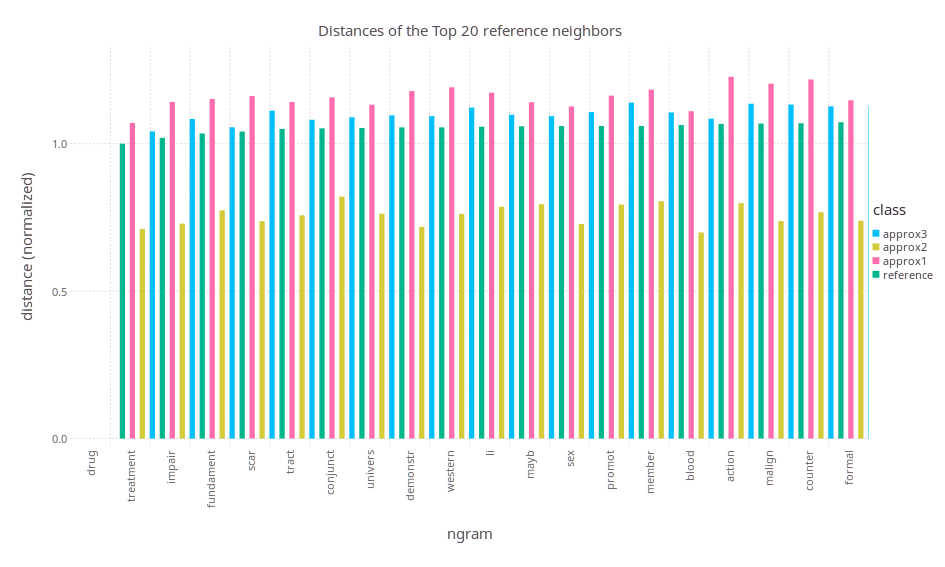

In [30]:
df2 = DataFrame()
for i in 1:size(df)[1]
    row = df[i,:]
    df2 = vcat(
    df2,
    DataFrame(ngram=row[:ngram], class="approx3", d=(row[:approx3] * norm_factor)),
    DataFrame(ngram=row[:ngram], class="approx2", d=(row[:approx2] * norm_factor)),
    DataFrame(ngram=row[:ngram], class="approx1", d=(row[:approx1] * norm_factor)),
    DataFrame(ngram=row[:ngram], class="reference", d=(row[:ref] * norm_factor)),
    )
end
Gadfly.plot(
    df2,
    x="ngram",
    y="d",
    color="class",
    Geom.bar(position=:dodge),
    Theme(bar_spacing=5mm),
    Coord.Cartesian(ymin=0, ymax=1.3),
    Guide.title("Distances of the Top 20 reference neighbors"),
    Guide.xticks(orientation=:vertical),
    Guide.ylabel("distance (normalized)")
)

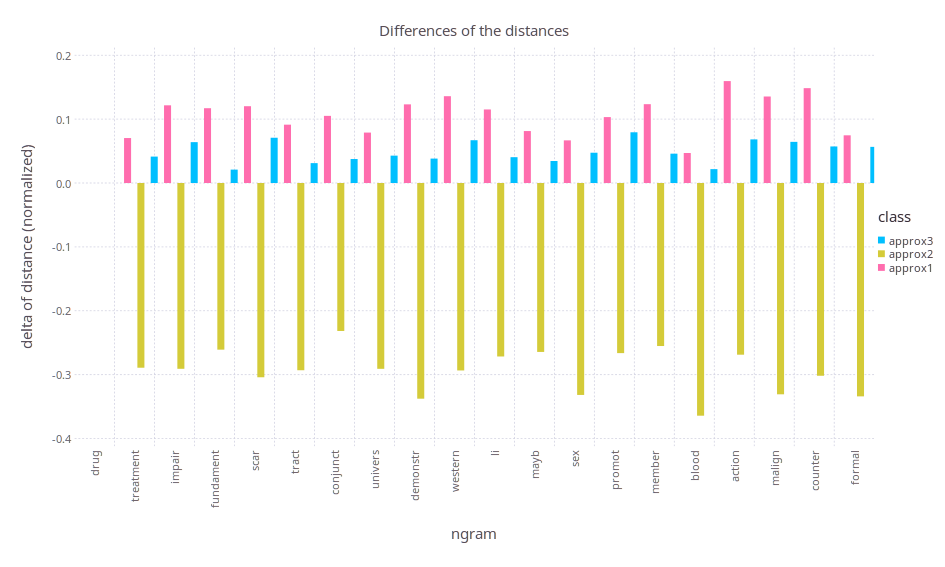

In [31]:
df3 = DataFrame()
for i in 1:size(df)[1]
    row = df[i,:]
    df3 = vcat(
    df3,
    DataFrame(ngram=row[:ngram], class="approx3", d=((row[:approx3] - row[:ref]) * norm_factor)),
    DataFrame(ngram=row[:ngram], class="approx2", d=((row[:approx2] - row[:ref]) * norm_factor)),
    DataFrame(ngram=row[:ngram], class="approx1", d=((row[:approx1] - row[:ref]) * norm_factor)),
    )
end
Gadfly.plot(
    df3,
    x="ngram",
    y="d",
    color="class",
    Geom.bar(position=:dodge),
    Theme(bar_spacing=5mm),
    Coord.Cartesian(ymin=-0.4, ymax=0.2),
    Guide.title("Differences of the distances"),
    Guide.xticks(orientation=:vertical),
    Guide.ylabel("delta of distance (normalized)")
)

It is obvious that the double filtering of `approx2` lowers the distances too much. `approx3` seems to be the best, so we select that one for the following parameter selection.

## Choice of the Compression Rate

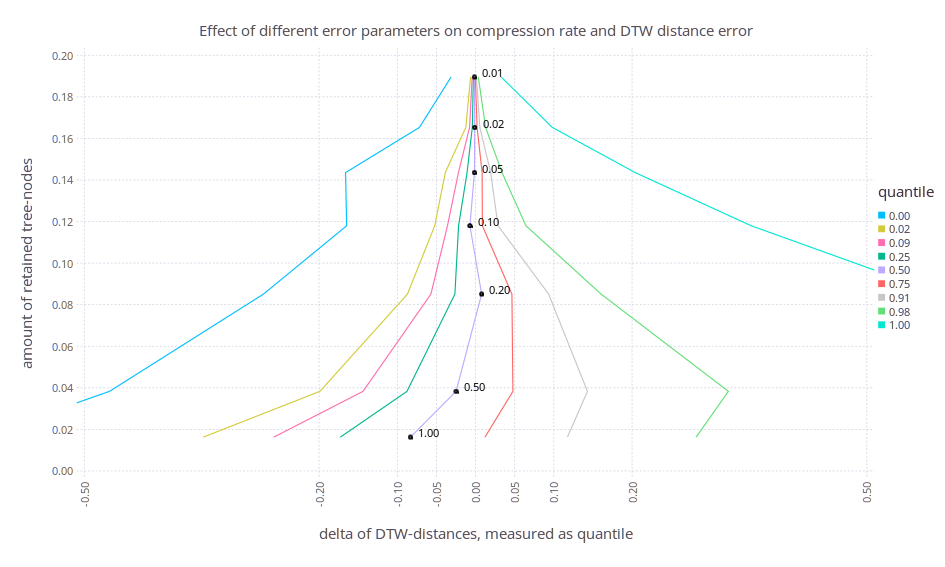

In [32]:
df_opt = vcat(
DataFrame(maxerror=0.01, rate=0.189524, mean=-0.00154, std=0.00237, min=-0.03123, q002=-0.00637, q009=-0.00436, q025=-0.00284, q045=-0.00174, median=-0.00150, q055=-0.00127, q075=-0.00028, q091=0.00102, q098=0.00350, max=0.03276,),
DataFrame(maxerror=0.02, rate=0.165278, mean=-0.00088, std=0.00614, min=-0.07175, q002=-0.01250, q009=-0.00766, q025=-0.00416, q045=-0.00165, median=-0.00110, q055=-0.00054, q075=0.00194, q091=0.00548, q098=0.01277, max=0.09796,),
DataFrame(maxerror=0.05, rate=0.143543, mean=-0.00136, std=0.01697, min=-0.16616, q002=-0.03869, q009=-0.02187, q025=-0.01089, q045=-0.00321, median=-0.00145, q055=0.00032, q075=0.00836, q091=0.01932, q098=0.03379, max=0.20391,),
DataFrame(maxerror=0.1, rate=0.117957, mean=-0.00466, std=0.02759, min=-0.16472, q002=-0.05220, q009=-0.03592, q025=-0.02173, q045=-0.01000, median=-0.00725, q055=-0.00446, q075=0.00866, q091=0.02865, q098=0.06435, max=0.35213,),
DataFrame(maxerror=0.2, rate=0.085071, mean=0.01397, std=0.05941, min=-0.27113, q002=-0.08706, q009=-0.05709, q025=-0.02644, q045=0.00114, median=0.00774, q055=0.01451, q075=0.04644, q091=0.09335, q098=0.16039, max=0.59492,),
DataFrame(maxerror=0.5, rate=0.0382883, mean=-0.00858, std=0.12146, min=-0.46783, q002=-0.19893, q009=-0.14380, q025=-0.08763, q045=-0.03713, median=-0.02491, q055=-0.01232, q075=0.04770, q091=0.14297, q098=0.32304, max=1.23820,),
DataFrame(maxerror=1, rate=0.0162454, mean=-0.07284, std=0.15351, min=-0.63483, q002=-0.34823, q009=-0.25805, q025=-0.17292, q045=-0.10032, median=-0.08328, q055=-0.06602, q075=0.01197, q091=0.11739, q098=0.28181, max=1.37079,),
)

df_opt2 = DataFrame()
for i in 1:size(df_opt)[1]
    row = df_opt[i,:]
    df_opt2 = vcat(
        df_opt2,
        DataFrame(quantile="0.00", rate=row[:rate], a=row[:min]),
        DataFrame(quantile="0.02", rate=row[:rate], a=row[:q002]),
        DataFrame(quantile="0.09", rate=row[:rate], a=row[:q009]),
        DataFrame(quantile="0.25", rate=row[:rate], a=row[:q025]),
        DataFrame(quantile="0.50", rate=row[:rate], a=row[:median]),
        DataFrame(quantile="0.75", rate=row[:rate], a=row[:q075]),
        DataFrame(quantile="0.91", rate=row[:rate], a=row[:q091]),
        DataFrame(quantile="0.98", rate=row[:rate], a=row[:q098]),
        DataFrame(quantile="1.00", rate=row[:rate], a=row[:max]),
    )
end

markers_x = convert(Array{Float64}, df_opt[:median])
markers_y = convert(Array{Float64}, df_opt[:rate])
markers_title = map(x -> @sprintf("%.2f", x), df_opt[:maxerror])

markers = Compose.compose(
    Compose.context(),
    Compose.compose(
        Compose.context(),
        Compose.circle(markers_x, markers_y, [0.002]),
        Compose.fill(nothing),
        Compose.stroke(colorant"black")
    ),
    Compose.compose(
        Compose.context(),
        Compose.text(markers_x .+ 0.01, markers_y .- 0.0015, markers_title),
        Compose.fill(colorant"black"),
        Compose.stroke(nothing),
        Compose.fontsize(3)
    )
)

Gadfly.plot(
    df_opt2,
    x="a",
    y="rate",
    color="quantile",
    Geom.path,
    Guide.title("Effect of different error parameters on compression rate and DTW distance error"),
    Coord.Cartesian(xmin=-0.5, xmax=0.5, ymin=0, ymax=0.2),
    Guide.annotation(markers),
    Guide.xticks(ticks=[-0.5, -0.2, -0.1, -0.05, 0, 0.05, 0.1, 0.2, 0.5], orientation=:vertical),
    Guide.yticks(ticks=collect(0.0:0.02:0.2)),
    Guide.xlabel("delta of DTW-distances, measured as quantile"),
    Guide.ylabel("amount of retained tree-nodes")
)

The maximum accepted error has (of course) an effect on the compression rate, but this influence is not of an linear kind of nature. Also shown is the delta of the DTW distances to the word "drug" when applying different levels of compression. While the delta of 96% of the data (quantile 0.02 to 0.98) stays relatively stable, there are some outliers (q 0.00 to 0.02 and 0.98 to 1.00). It should also be noted that the processing speed increases when the maximum error is increased due to the faster search operations when less tree data is persistent.